In [34]:
## Initialize
from ochumanApi.ochuman import OCHuman
from google.colab.patches import cv2_imshow
# <Filter>: 
#      None(default): load all. each has a bbox. some instances have keypoint and some have mask annotations.
#            images: 5081, instances: 13360
#     'kpt&segm' or 'segm&kpt': only load instances contained both keypoint and mask annotations (and bbox)
#            images: 4731, instances: 8110
#     'kpt|segm' or 'segm|kpt': load instances contained either keypoint or mask annotations (and bbox)
#            images: 5081, instances: 10375
#     'kpt' or 'segm': load instances contained particular kind of annotations (and bbox)
#            images: 5081/4731, instances: 10375/8110
ochuman = OCHuman(AnnoFile='./ochuman.json', Filter='segm')
image_ids = ochuman.getImgIds()
print ('Total images: %d'%len(image_ids))

Total images: 4731


[0 1]
[0 1]


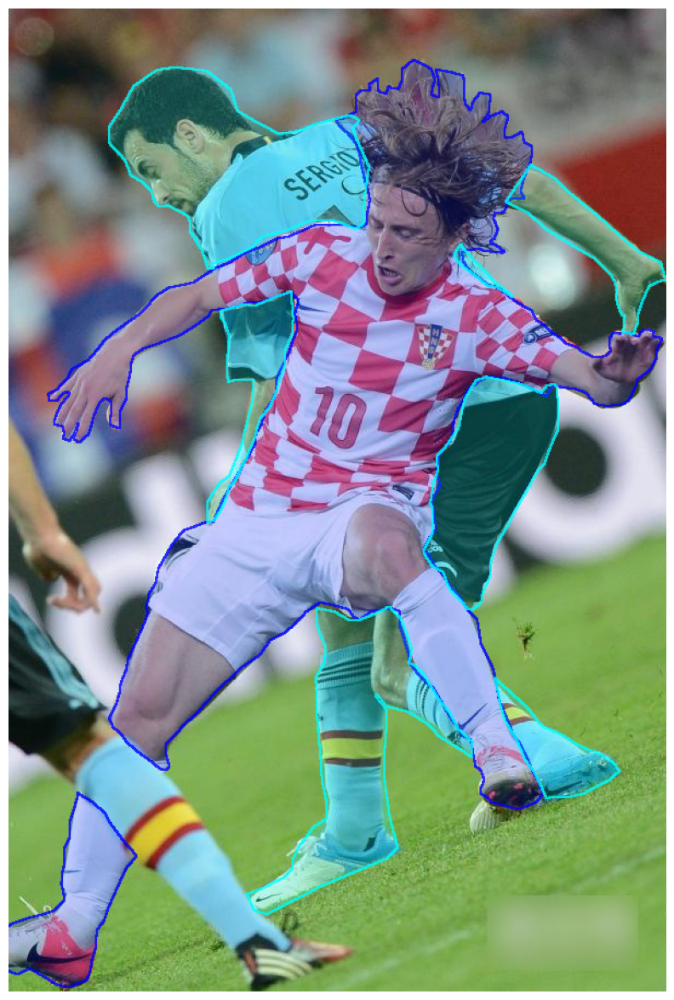

In [41]:
## Load annotations & Visualize
import cv2, os
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (15, 15)
import ochumanApi.vis as vistool
from ochumanApi.ochuman import Poly2Mask
import numpy as np

ImgDir = './images/'
data = ochuman.loadImgs(imgIds=[image_ids[2]])[0]

img = cv2.imread(os.path.join(ImgDir, data['file_name']))
height, width = data['height'], data['width']

colors = [[255, 0, 0], 
         [255, 255, 0],
         [0, 255, 0],
         [0, 255, 255], 
         [0, 0, 255], 
         [255, 0, 255]]

for i, anno in enumerate(data['annotations']):
    bbox = anno['bbox']
    kpt = anno['keypoints']
    segm = anno['segms']
    max_iou = anno['max_iou']

    #img = vistool.draw_bbox(img, bbox, thickness=3, color=colors[i%len(colors)])
    if segm is not None:
        mask = Poly2Mask(segm)
        print(np.unique(mask))
        img = vistool.draw_mask(img, mask, thickness=0, color=colors[i%len(colors)])
    #if kpt is not None:
        #img = vistool.draw_skeleton(img, kpt, connection=None, colors=colors[i%len(colors)], bbox=bbox)

plt.imshow(img[:,:,::-1])
plt.axis('off')
plt.show()

In [12]:
## Convert to coco format.
# <maxIouRange>: 
#     (0.0, 1.0) means all instances
#     (0.5, 0.75) means Moderate instances
#     (0.75, 1.0) means Hard instances
ochuman.toCocoFormat(subset='val', maxIouRange=(0.0, 1.0), save_dir='./')
ochuman.toCocoFormat(subset='test', maxIouRange=(0.0, 1.0), save_dir='./')

convert OCHuman to COCO format done. total 4291 persons within 2500 images.
convert OCHuman to COCO format done. total 3819 persons within 2231 images.


In [7]:
ochuman.loadImgs(ochuman.getImgIds())

[{'annotations': [{'max_iou': 0.6027624011039734,
    'keypoints': [302,
     285,
     1,
     343,
     390,
     1,
     431,
     363,
     1,
     478,
     258,
     1,
     577,
     287,
     3,
     661,
     282,
     1,
     352,
     477,
     1,
     335,
     643,
     1,
     307,
     810,
     1,
     430,
     486,
     3,
     416,
     662,
     1,
     329,
     785,
     1,
     353,
     141,
     1,
     376,
     244,
     1,
     328.49723669132726,
     196.90978452976526,
     1,
     397.6046906555844,
     184.91480238212299,
     1,
     371.5701271305881,
     188.86769422623237,
     1,
     353.4413472938106,
     177.5542451551607,
     1,
     380.9752835872622,
     174.5554996182501,
     1],
    'segms': {'outer': [[622.1113669622191,
       268.7140063205055,
       635.2836803099337,
       270.26369024376606,
       652.3302034657997,
       270.26369024376606,
       662.4031489669933,
       268.7140063205055,
       677.1251462379686,
      